<h1>Machine Learning Uniquindio UTP 2024-1<h1/>
notebook adaptado por Jonnatan Arias Garcia

jariasg@uniquindio.edu.co jonnatan.arias@utp.edu.co

# Clustering K-means

En esta notebook vamos a explorar el algoritmo de partición **K-Means**, que aplicaremos al dataset de caras Olivetti, para tratar de agrupar las fotos según la persona a la que se le sacó la foto.

In [1]:
# importamos las librerías usuales de python
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# importamos los algoritmos de clusterizacion a utilizar en esta notebook
from sklearn.cluster import KMeans                    # K-means
from sklearn.cluster import AgglomerativeClustering   # Clustering jerárquico

Para agilizar el proceso de clusterización en el dataset de caras vamos identificar las componentes principales como en la clase pasada.

In [2]:
# Estandarizador (transforma las variables en z-scores)
from sklearn.preprocessing import StandardScaler
std_scale = StandardScaler() # Creamos el estandarizador

## [K-Means](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html#sklearn.cluster.KMeans)

* Busca encontrar *k* clusters de modo tal que se minimice la varianza intra-cluster medida, usualmente, como el cuadrado de la distancia euclídea.

* Para ello el algoritmo empieza encontrando *k centroids* y le asigna a cada sample la etiqueta correspondiente a la del centroid más cercano.

* Una vez actualizadas las etiquetas de todas las samples, calcula la posición de los k centroids (como el promedio de las features de las samples de cada cluster) y vuelve a asignar etiquetas a cada sample de acuerdo a la distancia al centroid más cercano.

* Hace estos dos pasos hasta que no haya más cambios de etiqueta.

* Debido a esta inicialización aleatoria de los k centroids el output del modelo puede variar al aplicarlo otra vez a la misma data.

* Por ello se repite este procedimiento n_init=10 veces y el output final es el que mejor resultado tuvo al minimizar la función objetivo (varianza intra-cluster).

### Clustering en el dataset de caras Olivetti


* El dataset consta de 10 fotos de 64*64 pixeles en escala de grises de 40 personas distintas. Cada sample (foto) importada es un vector de 4096 elementos, los cuales representan las filas de pixeles ordenadas de arriba hacia abajo de la foto. Es decir, los primeros 64 elementos corresponden a la fila superior de pixeles de la imagen y así sucesivamente.

In [3]:
from sklearn.datasets import fetch_olivetti_faces # para cargar el dataset de caras
data, targets = fetch_olivetti_faces(return_X_y = True) # cargamos las caras

print('Dimensión de los datos {}'.format(data.shape))

downloading Olivetti faces from https://ndownloader.figshare.com/files/5976027 to /root/scikit_learn_data
Dimensión de los datos (400, 4096)


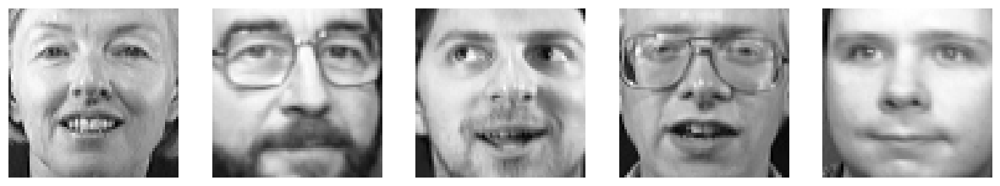

In [4]:
import matplotlib.pyplot as plt
import numpy as np

# Seleccionar 5 índices aleatorios
random_indexes = np.random.choice(data.shape[0], 5, replace=False)

# Mostrar las caras correspondientes a los índices aleatorios
fig, axes = plt.subplots(1, 5, figsize=(15, 3))
for i, ax in enumerate(axes):
    ax.imshow(data[random_indexes[i]].reshape(64, 64), cmap='gray')
    ax.axis('off')
plt.show()

Antes que nada realizamos una descomposición en componentes principales. Notar que todos los features (pixeles) están en la misma escala (de 0 a 255) y por ese motivo no hacemos una normalización previa.

In [5]:
# Clase para realizar componentes principales
from sklearn.decomposition import PCA

# Creación del modelo de PCA con 100 componentes
pca = PCA(n_components = 100)

# Ajuste y transformación de los datos
pca.fit(data)
X_pca = pca.transform(data)

Chequeamos que la matriz X_pca tiene las dimensiones correspondientes (400 samples, 100 PCs)

In [6]:
X_pca.shape

(400, 100)

In [7]:
X_pca

array([[-6.432614  , -0.70367193, -1.4300231 , ..., -0.01382122,
         0.28994954, -0.20131925],
       [-1.0758903 , -6.6973376 ,  1.842797  , ..., -0.21264827,
        -0.16964431, -0.11622643],
       [-5.29295   , -1.5425153 ,  0.22595268, ...,  0.3247487 ,
         0.06427187,  0.4407011 ],
       ...,
       [ 2.040768  , -1.5096155 ,  3.4487307 , ..., -0.5177385 ,
        -0.09285033, -0.13164912],
       [-5.165242  ,  8.096761  , -0.67100024, ...,  0.01197562,
         0.03277631,  0.189458  ],
       [-1.1505046 ,  2.4350314 ,  1.1894975 , ...,  0.0630748 ,
        -0.21002367,  0.42701665]], dtype=float32)

Ploteamos el dataset en el espacio de las primeras dos componentes principales

Text(0, 0.5, 'Segunda componente principal')

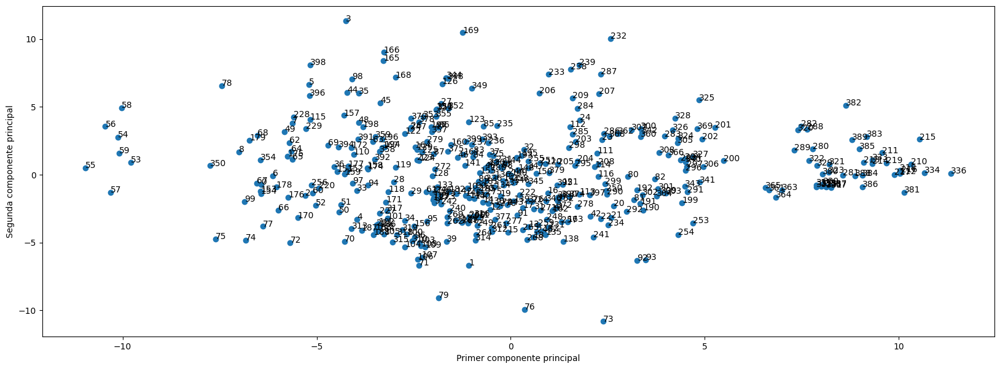

In [8]:
fig, ax = plt.subplots(figsize = (20, 7))

# Hacemos un scatter plot de cada uno de los datos
ax.scatter(X_pca[:, 0], X_pca[:, 1])

# Por cada dato escribimos a qué instancia corresponde
for i in range(data.shape[0]):
  ax.text(X_pca[i, 0], X_pca[i, 1], s = i)

ax.set_xlabel('Primer componente principal')
ax.set_ylabel('Segunda componente principal')

Ahora sí aplicamos el método de clusterización K-Means para agrupar las fotos en base a sus componentes principales. Como sabemos que el dataset consta de 40 personas diferentes utilizamos esta información para pedirle al algoritmo que encuentre k=40 clusters con la esperanza que podamos agrupar las fotos según la persona que está en ella.

In [9]:
# Creación del modelo KMeans con k = 40
kmeans = KMeans(n_clusters=40)

# Ajuste del modelo a los datos reducidos en componentes principales
kmeans.fit(X_pca)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(n_clusters=40)

Para acceder a las etiquetas que le asignó el modelo a cada sample usamos 'kmeans.labels_'

In [10]:
# Nos fijamos las etiquetas asignadas a las primeras 10 muestras y los counts que recibió cada una
np.unique(kmeans.labels_[:10], return_counts=True)

(array([ 9, 27, 32, 39], dtype=int32), array([2, 4, 3, 1]))

* Idealmente queríamos tener una sola etiqueta en las primeras 10 muestras ya que corresponden a las fotos tomadas a una dada persona. Sin embargo obtuvimos etiquetas distintas.

* Veamos qué es lo que está pasando. Vamos a plotear el dataset en el espacio de las primeras dos componentes principales pero además vamos a asignarle un color a cada sample que corresponde a la etiqueta asignada por el modelo. También vamos a graficar con una "X" el centroid de cada cluster.

Para acceder a la posición de los centroids en el espacio de 100 PCs usamos 'kmeans.cluster_centers_'

In [11]:
# Guardo las posiciones de los centroids
centroids = kmeans.cluster_centers_

# Printeo las dimensiones de las posiciones
print("Shape de los centroids:",centroids.shape)
# Printeo las posiciones de las primeras 5 muestras en sus primeras dos componentes principales
print(centroids[:5,[0,1]])

Shape de los centroids: (40, 100)
[[ 9.851038    0.81427705]
 [-4.53857    -0.09034315]
 [ 2.6624098  -2.4837258 ]
 [-3.5281036  -4.1129184 ]
 [ 4.228815    1.5884954 ]]


Text(0, 0.5, 'Segunda componente principal')

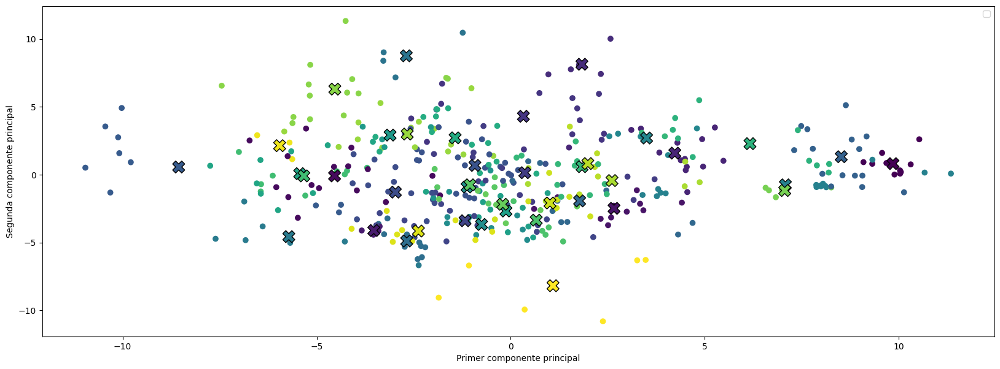

In [12]:
# Este bloque es similar al anterior pero agregando color a cada sample en el scatter plot según la etiqueta asignada

fig, ax = plt.subplots(figsize = (20, 7))

# Hacemos un scatter plot de cada uno de los datos
ax.scatter(X_pca[:, 0], X_pca[:, 1], c=kmeans.labels_)
ax.scatter(centroids[:, 0], centroids[:, 1], marker="X", s=200, linewidths=1,
            c=np.unique(kmeans.labels_), edgecolors='black')
ax.legend()

## Por cada dato escribimos a qué instancia corresponde
#for i in range(data.shape[0]):
#  ax.text(X_pca[i, 0], X_pca[i, 1], s = i)

ax.set_xlabel('Primer componente principal')
ax.set_ylabel('Segunda componente principal')

En este plot podemos ver que hay samples más alejados de la nube principal de puntos que tienen un color definido. Sin embargo más al centro del plot vemos que los colores se mezclan y esto se debe a que KMeans funciona bien cuando los grupos tienen forma de una esfera en n_features-dimensiones pero falla en otros casos.

Parecería ser que los clusters que encuentra no son los que queríamos que nos diera el modelo. Pero entonces, ¿qué son estos clusters? Plotiemos las imágenes correspondientes a cada cluster.

<ipython-input-13-ff3247322718>:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(1, num, figsize=(24, 4),


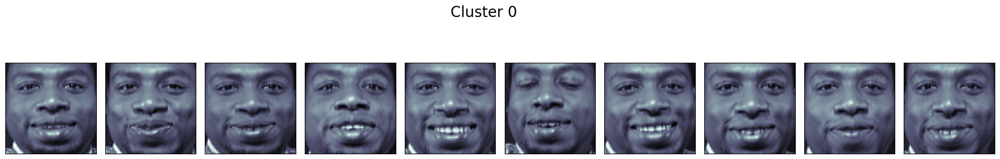

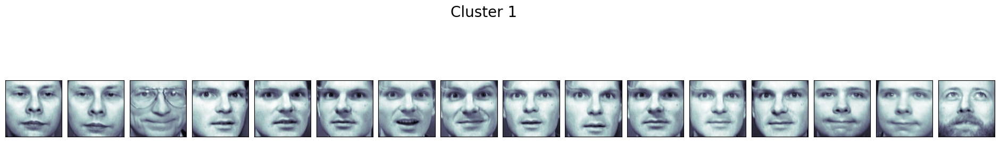

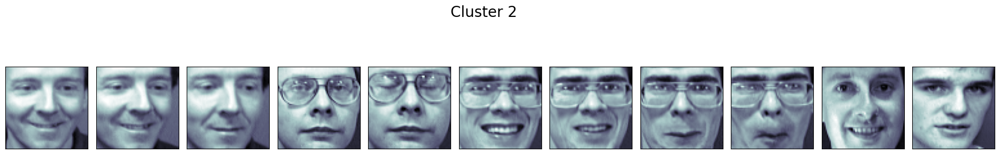

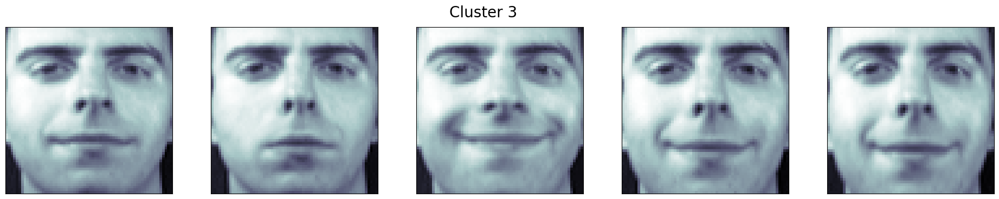

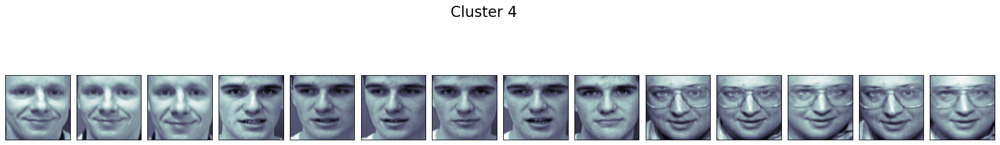

...

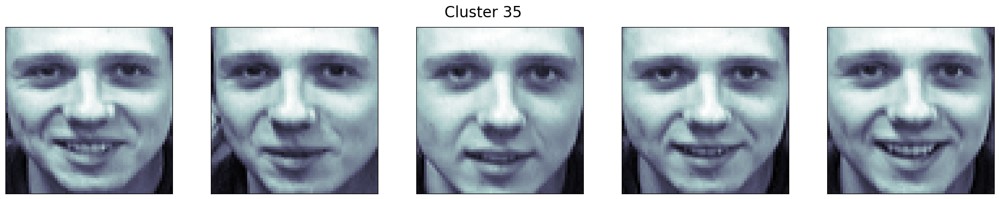

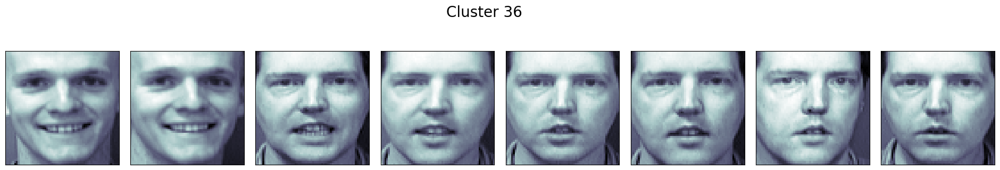

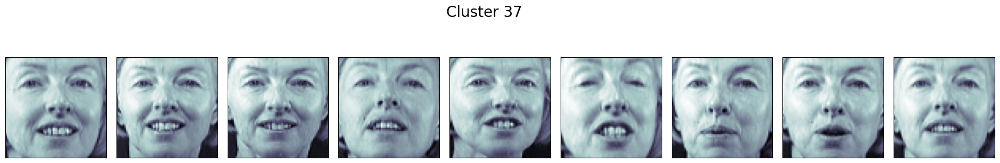

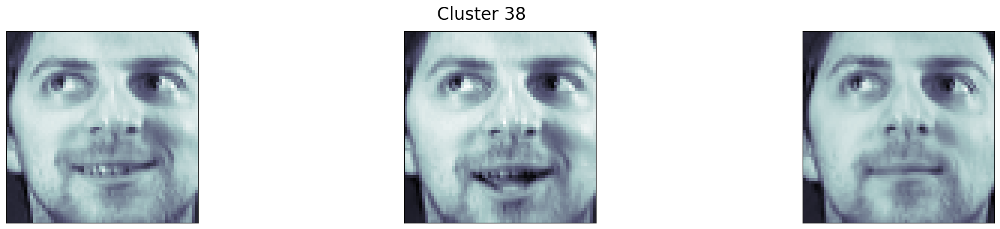

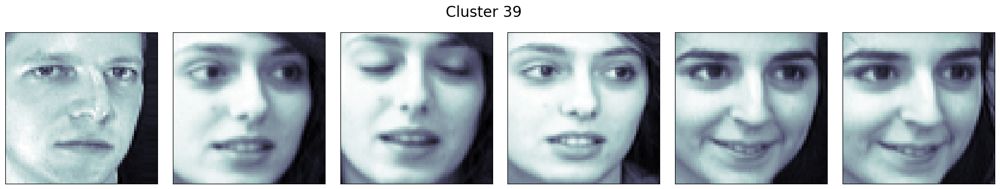

In [13]:
# Mostrar el resultado final
labels = kmeans.labels_

# Iniciamos un for con k=40 iteraciones
for i in range(40):
    index = np.nonzero(labels==i)[0]                                    # los índices correspondientes a la i-ésima etiqueta
    num = len(index)                                                    # el número de samples en cada cluster
    this_faces = data[index].reshape(len(index),64,64)                  # reshapeamos los samples del i-ésimo cluster para que tenga el formato de una imagen de (64,64) pixeles
    fig, axes = plt.subplots(1, num, figsize=(24, 4),
                             subplot_kw={'xticks':[], 'yticks':[]},
                             gridspec_kw=dict(hspace=0.1, wspace=0.1))
    fig.suptitle("Cluster " + str(i), fontsize=20)
    for i, ax in enumerate(np.ravel(axes)):
        ax.imshow(this_faces[i], cmap='bone')

Vemos que varios de los clusters sí corresponden a las fotos de una persona. Además en casi todos se puede entender por qué el método esta agrupando las fotos.... lo notas?

### Elección del número de clusters *k*

No hay un consenso en cómo elegir el parámetro *k* para el método KMeans.

En algunos casos tenemos una idea de en cuántos grupos deberían estar divididos nuestros datos y simplemente elegimos ese número.

Pero en muchos otros casos esta información no la tenemos al momento de hacer el clustering.

En esta parte vamos a ver dos approachs para la elección de k:
1. Método del codo
2. Coeficiente de Silhouette

#### 1 [Método del codo](https://en.wikipedia.org/wiki/Elbow_method_(clustering)#:~:text=In%20cluster%20analysis%2C%20the%20elbow,number%20of%20clusters%20to%20use.)

Se hace un grafico de la función objetivo en función de la elección de k y se elige el k correspondiente al punto donde agregar un cluster más no baja significativamente el valor que queremos minimzar. Esto se puede detectar a ojo o utilizando algún paquete de python como ['kneed'](https://raghavan.usc.edu//papers/kneedle-simplex11.pdf)

Vamos a aplicar el método KMeans al dataset de caras pero cambiando el número de clusters k y guardaremos el puntaje de la función objetivo, SSE (suma de los cuadrados de la distancia euclidea de cada cluster), en una lista

$$
S S E=\sum_{i=1}^n\left(y_i-\hat{y}_i\right)^2
$$

Donde:
- $n$ es el número de observaciones
- $y_i$ son los valores observados
- $\hat{y}_i$ son los valores predichos

In [14]:
sse = [] # acá vamos a guardar el puntaje de la función objetivo

for k in range(1, 40):
  kkmeans = KMeans(n_clusters=k)
  kkmeans.fit(data)
  sse.append(kkmeans.inertia_)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

Graficamos SEE en función del número de clusters k

Text(0, 0.5, 'SSE')

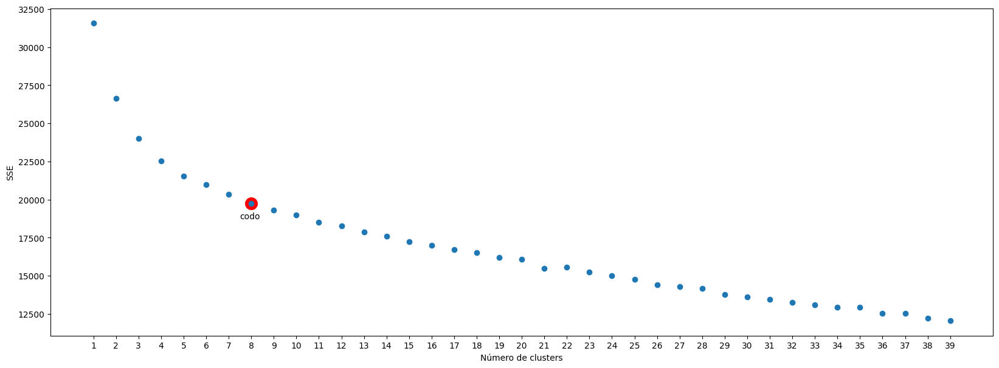

In [15]:
fig, ax = plt.subplots(figsize = (20, 7))

# esta dos lineas las agrego para que se vea la elección de KneeLocator para el codo en este gráfico
ax.scatter(8, sse[7], color='red', s=200) # agregamos un punto rojo al plot de tamaño s=200 en el lugar donde se encuentra el codo
ax.text(7.5, sse[7]-1000, s="codo")       # agregamos un texto abajo para indicar qué representa el punto

# estas lineas son el grafico de SSEvsK
ax.scatter(range(1, 40), sse)
ax.set_xticks(range(1, 40))
ax.set_xlabel("Número de clusters")
ax.set_ylabel("SSE")

En este plot podemos ver dos cosas:
1. SSE es monótonamente decreciente: al agregar un cluster la distancia entre todas las samples a los centroides siempre va a reducirse
2. A ojo distinguimos un codo entre k=5 y k=9 porque al agregar más clusters aumentamos la complejidad del modelo pero SEE disminuye en menor proporción

In [16]:
!pip install kneed            # instalamos el paquete con pip
from kneed import KneeLocator # importamos el paquete para detectar el codo

Usamos la función 'KneeLocator' para detectar el codo. Para ello le tenemos que pasar los valores de K, SEE, la forma de la fución (cóncava o convexa) y la dirección (creciente o decreciente)

In [17]:
kl = KneeLocator(range(1, 40), sse, curve="convex", direction="decreasing")

print("El codo está en k =", kl.elbow)

El codo está en k = 8


Veamos entonces cómo se ve el modelo con k={kl} para el dataset de caras Olivetti

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Text(0, 0.5, 'Segunda componente principal')

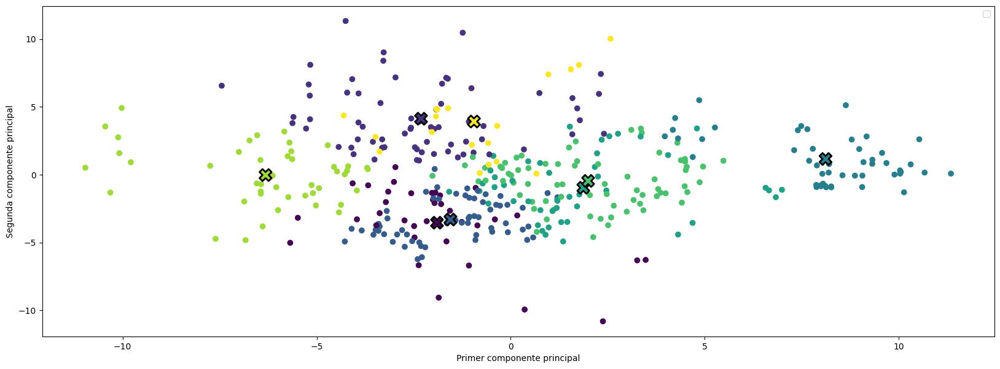

In [18]:
# Creación del modelo KMeans con k = kl.elbow
kmeans8 = KMeans(n_clusters=kl.elbow)

# Ajuste del modelo a los datos reducidos en componentes principales
kmeans8.fit(X_pca)

# Guardamos la posición de los centroids
centroids8 = kmeans8.cluster_centers_

# Plot
fig, ax = plt.subplots(figsize = (20, 7))

# Hacemos un scatter plot de cada uno de los datos
ax.scatter(X_pca[:, 0], X_pca[:, 1], c=kmeans8.labels_)
ax.scatter(centroids8[:, 0], centroids8[:, 1], marker="X", s=200, linewidths=2,
            c=np.unique(kmeans8.labels_),edgecolors='black')
ax.legend()

## Por cada dato escribimos a qué instancia corresponde
#for i in range(data.shape[0]):
#  ax.text(X_pca[i, 0], X_pca[i, 1], s = i)

ax.set_xlabel('Primer componente principal')
ax.set_ylabel('Segunda componente principal')

#### 2 Coeficiente de Silhouette

El coeficiente de Silhouette mide qué tan cerca está una muestra a las otras muestras de su cluster y qué tan lejos está con respecto a las muestras del cluster más cercano. Este coeficiente toma valores de [-1,1], -1 sería si los clusters están superpuestos, 0 si hay overlap y 1 que no se tocan (Caso optimo).

El coeficiente de Silhouette de cada sample la podemos obtener con la clase 'silhouette_samples' de sklearn.metrics

El puntaje de Silhouette es el promedio de los coeficientes de Silhouette de todas las samples y se computa con la clase 'silhouette_score' de sklearn.metrics. Hay que pasarle a la función los datos y sus etiquetas.

In [19]:
# importamos el puntaje de silhouette
from sklearn.metrics import silhouette_score

In [20]:
# Creamos una lista para guardar de los coeficientes de silhouette para cada valor de k
silhouette_coefficients = []

# Se necesita tener al menos 2 clusters y a los sumo N-1 (con N el numero de muestras) para obtener coeficientes de Silohuette
for k in range(2, 20):
     kkkmeans = KMeans(n_clusters=k)
     kkkmeans.fit(data)
     score = silhouette_score(data, kkkmeans.labels_)
     silhouette_coefficients.append(score)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

Graficamos el puntaje de Silhouette en función de k

Text(0, 0.5, 'Promedio coeficientes de Silhouette')

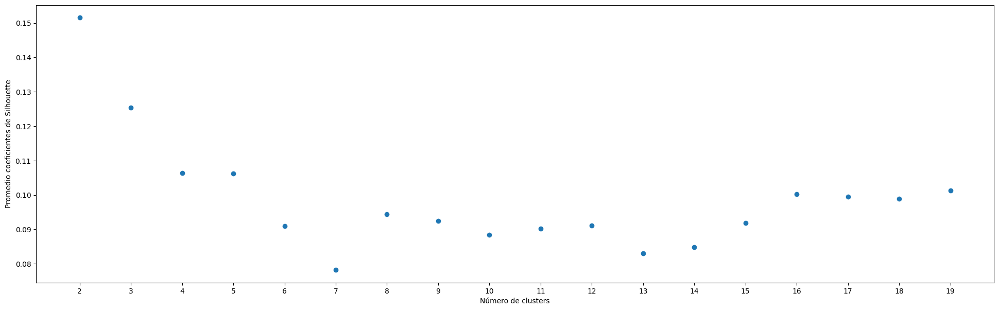

In [21]:
fig, ax = plt.subplots(figsize = (24, 7))

# estas lineas son el grafico de SSEvsK
ax.scatter(range(2, 20), silhouette_coefficients)
ax.set_xticks(range(2, 20))
ax.set_xlabel("Número de clusters")
ax.set_ylabel("Promedio coeficientes de Silhouette")

In [22]:
kklabels = kkkmeans.labels_
kkklabels = kklabels.copy()

np.random.shuffle(kkklabels)

silhouette_score(data, kkklabels)

-0.08515355

En este plot vemos que el puntaje de Silhouette < 0.2 y tiene poca desviación.

Se puede decir que **no se encuentran estructuras fuertes en los datos** y es necesaria una *inspección manual* de ellos para determinar el número óptimo de clusters (y/o probar con otros métodos). Sin embargo en muchos dataset reales va a pasar que no todo se puede hacer de manera automática y se debe tener intuición o noción de lo que están representando los datos para un realizar un análisis correcto.